<a href="https://colab.research.google.com/github/eueu29/AIFFEL_quest/blob/main/Keras/CV_Project_LYJ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### data augmentation

모듈 불러오기

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

데이터 불러오기

In [ ]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

train/validation data별로 directory 지정하기

In [ ]:
train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')
print(train_dir)
print(validation_dir)

/root/.keras/datasets/cats_and_dogs_filtered/train
/root/.keras/datasets/cats_and_dogs_filtered/validation


label별로 directory 지정하기

In [ ]:
# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')
print(train_cats_dir)

# directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')
print(train_dogs_dir)

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')
print(validation_cats_dir)

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')
print(validation_dogs_dir)

/root/.keras/datasets/cats_and_dogs_filtered/train/cats
/root/.keras/datasets/cats_and_dogs_filtered/train/dogs
/root/.keras/datasets/cats_and_dogs_filtered/validation/cats
/root/.keras/datasets/cats_and_dogs_filtered/validation/dogs


항목별 data 갯수 헤아리기

In [ ]:
num_cats_tr = len(os.listdir(train_cats_dir))
print('total training cat images:', num_cats_tr)
num_dogs_tr = len(os.listdir(train_dogs_dir))
print('total training dog images:', num_dogs_tr)

print("--")

num_cats_val = len(os.listdir(validation_cats_dir))
print('total validation cat images:', num_cats_val)
num_dogs_val = len(os.listdir(validation_dogs_dir))
print('total validation dog images:', num_dogs_val)

print("--")

total_train = num_cats_tr + num_dogs_tr
print("Total training images:", total_train)
total_val = num_cats_val + num_dogs_val
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
--
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


In [ ]:
# parameter Initialization
batch_size = 16
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

Data Augmentation

In [ ]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False)

In [ ]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


In [ ]:
train_data_gen[0][0].shape

(16, 256, 256, 3)

16개의 (256 * 256 * 3)의 사진이 있음(batch_size = 16)


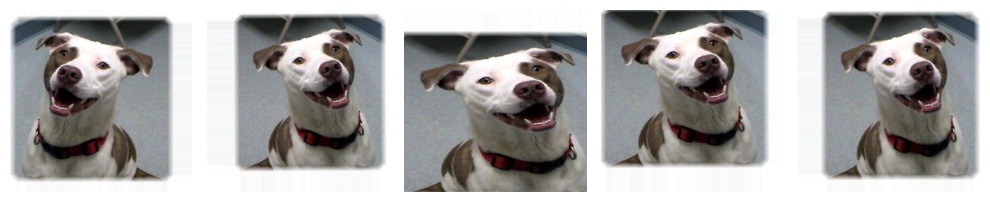

In [ ]:
#[0][0][n]이면 n번째 data가 5번 random augmentation 된 상태로 출력됨
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

 Validation 데이터는 classification이 잘 되는지 평가하는 용도로 사용되기 때문에 데이터의 스케일만 변경

In [ ]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [ ]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


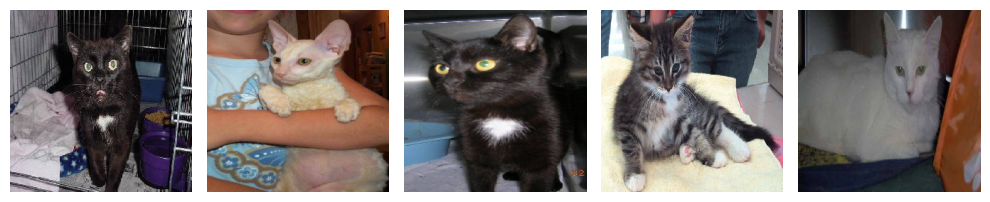

In [ ]:
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [ ]:
_[:5] # 정답 데이터

array([0., 0., 0., 0., 0.], dtype=float32)

# VGG model

### 문제 1-1 : VGG model 구현하기

In [ ]:
input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(1024, activation='relu')(x)
x=tf.keras.layers.Dense(512, activation='relu')(x)
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])

In [ ]:
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [ ]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1)

Epoch 1/5
125/125 [==============================] - 51s 320ms/step - loss: 35.5976 - binary_accuracy: 0.4915 - val_loss: 0.6964 - val_binary_accuracy: 0.4980
Epoch 2/5
125/125 [==============================] - 43s 341ms/step - loss: 0.8886 - binary_accuracy: 0.4920 - val_loss: 0.6990 - val_binary_accuracy: 0.5000
Epoch 3/5
125/125 [==============================] - 39s 311ms/step - loss: 0.6950 - binary_accuracy: 0.4830 - val_loss: 0.6925 - val_binary_accuracy: 0.5000
Epoch 4/5
125/125 [==============================] - 39s 312ms/step - loss: 0.7802 - binary_accuracy: 0.5005 - val_loss: 0.6933 - val_binary_accuracy: 0.5000
Epoch 5/5
125/125 [==============================] - 40s 317ms/step - loss: 0.6938 - binary_accuracy: 0.5010 - val_loss: 0.6931 - val_binary_accuracy: 0.5000


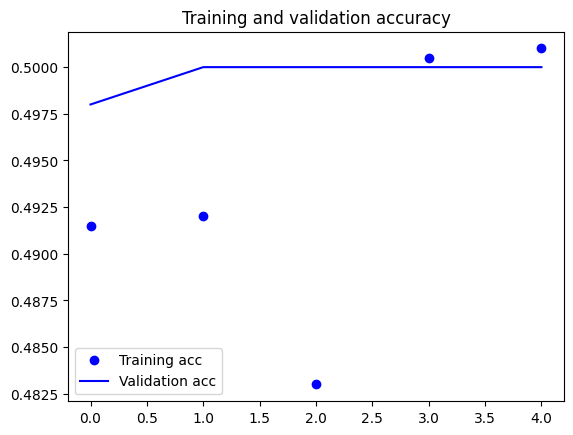

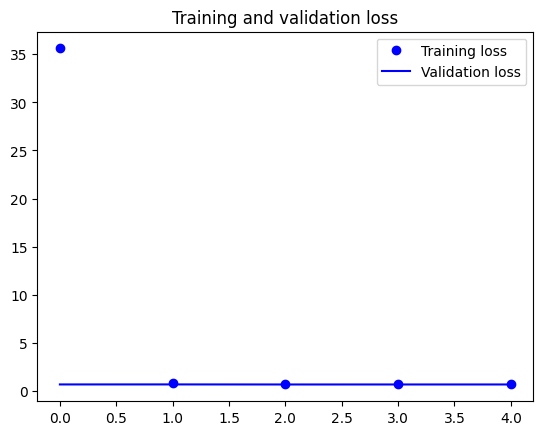

In [ ]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### 문제 1-2. VGG model 개선하기

##### hyperparameter 128 size layer 추가



In [ ]:
batch_size = 16
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False)

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
input_layer2=tf.keras.layers.Input(shape=(256, 256, 3))
x2=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer2)
x2=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.BatchNormalization()(x2)
x2=tf.keras.layers.MaxPool2D((2, 2))(x2)

x2=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.BatchNormalization()(x2)
x2=tf.keras.layers.MaxPool2D((2, 2))(x2)

x2=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.BatchNormalization()(x2)
x2=tf.keras.layers.MaxPool2D((2, 2))(x2)

x2=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.BatchNormalization()(x2)
x2=tf.keras.layers.MaxPool2D((2, 2))(x2)

x2=tf.keras.layers.Flatten()(x2)
x2=tf.keras.layers.Dense(1024, activation='relu')(x2)
x2=tf.keras.layers.Dense(512, activation='relu')(x2)
out_layer2=tf.keras.layers.Dense(1, activation='sigmoid')(x2)

model2 = tf.keras.Model(inputs=[input_layer2], outputs=[out_layer2])

In [ ]:
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.001)
metric=tf.keras.metrics.binary_accuracy
model2.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [ ]:
history2 = model2.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1)

Epoch 1/10
62/62 [==============================] - 53s 634ms/step - loss: 3.5322 - binary_accuracy: 0.5470 - val_loss: 0.9356 - val_binary_accuracy: 0.5470
Epoch 2/10
62/62 [==============================] - 38s 610ms/step - loss: 0.8814 - binary_accuracy: 0.5845 - val_loss: 1.5200 - val_binary_accuracy: 0.4820
Epoch 3/10
62/62 [==============================] - 37s 599ms/step - loss: 0.7039 - binary_accuracy: 0.6045 - val_loss: 0.8993 - val_binary_accuracy: 0.5350
Epoch 4/10
62/62 [==============================] - 37s 588ms/step - loss: 0.6521 - binary_accuracy: 0.6515 - val_loss: 0.8348 - val_binary_accuracy: 0.5260
Epoch 5/10
62/62 [==============================] - 37s 590ms/step - loss: 0.6467 - binary_accuracy: 0.6565 - val_loss: 0.9509 - val_binary_accuracy: 0.5520
Epoch 6/10
62/62 [==============================] - 38s 604ms/step - loss: 0.6375 - binary_accuracy: 0.6560 - val_loss: 5.7692 - val_binary_accuracy: 0.5000
Epoch 7/10
62/62 [==============================] - 38s 60

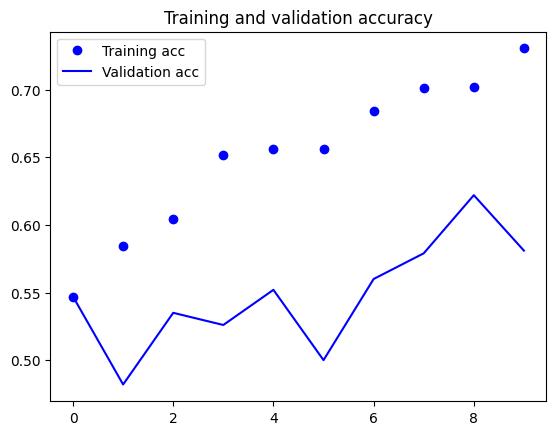

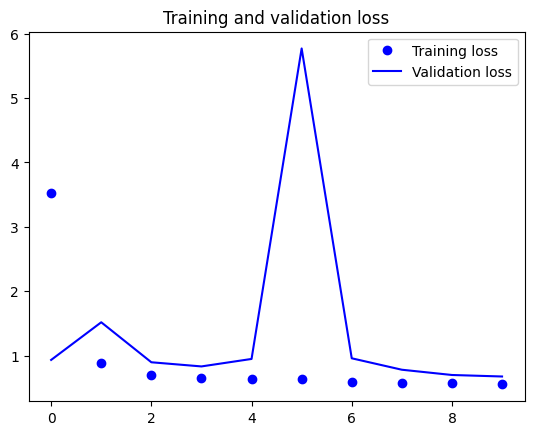

In [ ]:
acc = history2.history['binary_accuracy']
val_acc = history2.history['val_binary_accuracy']
loss = history2.history['loss']
val_loss = history2.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

##### hyperparameter 128 size layer 추가, batch 32, epoch 10, Adam



In [ ]:
batch_size = 32   # 16->32로 수정
epochs = 10       # 5->10으로 수정
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False)

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
input_layer2=tf.keras.layers.Input(shape=(256, 256, 3))
x2=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer2)
x2=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.BatchNormalization()(x2)
x2=tf.keras.layers.MaxPool2D((2, 2))(x2)

x2=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.BatchNormalization()(x2)
x2=tf.keras.layers.MaxPool2D((2, 2))(x2)

x2=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.BatchNormalization()(x2)
x2=tf.keras.layers.MaxPool2D((2, 2))(x2)

x2=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x2)
x2=tf.keras.layers.BatchNormalization()(x2)
x2=tf.keras.layers.MaxPool2D((2, 2))(x2)

x2=tf.keras.layers.Flatten()(x2)
x2=tf.keras.layers.Dense(1024, activation='relu')(x2)
x2=tf.keras.layers.Dense(512, activation='relu')(x2)
out_layer2=tf.keras.layers.Dense(1, activation='sigmoid')(x2)

model2 = tf.keras.Model(inputs=[input_layer2], outputs=[out_layer2])

In [ ]:
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.001)
metric=tf.keras.metrics.binary_accuracy
model2.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [ ]:
history2 = model2.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1)

Epoch 1/10
62/62 [==============================] - 53s 634ms/step - loss: 3.5322 - binary_accuracy: 0.5470 - val_loss: 0.9356 - val_binary_accuracy: 0.5470
Epoch 2/10
62/62 [==============================] - 38s 610ms/step - loss: 0.8814 - binary_accuracy: 0.5845 - val_loss: 1.5200 - val_binary_accuracy: 0.4820
Epoch 3/10
62/62 [==============================] - 37s 599ms/step - loss: 0.7039 - binary_accuracy: 0.6045 - val_loss: 0.8993 - val_binary_accuracy: 0.5350
Epoch 4/10
62/62 [==============================] - 37s 588ms/step - loss: 0.6521 - binary_accuracy: 0.6515 - val_loss: 0.8348 - val_binary_accuracy: 0.5260
Epoch 5/10
62/62 [==============================] - 37s 590ms/step - loss: 0.6467 - binary_accuracy: 0.6565 - val_loss: 0.9509 - val_binary_accuracy: 0.5520
Epoch 6/10
62/62 [==============================] - 38s 604ms/step - loss: 0.6375 - binary_accuracy: 0.6560 - val_loss: 5.7692 - val_binary_accuracy: 0.5000
Epoch 7/10
62/62 [==============================] - 38s 60

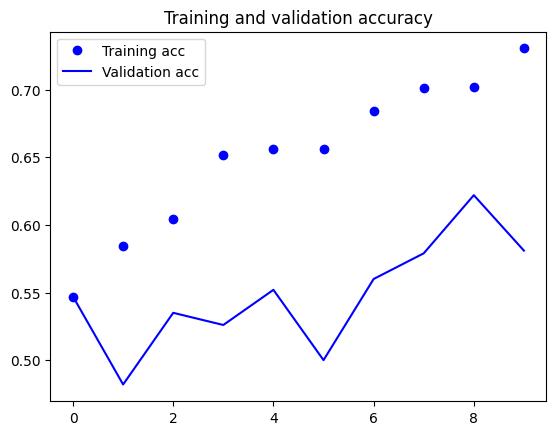

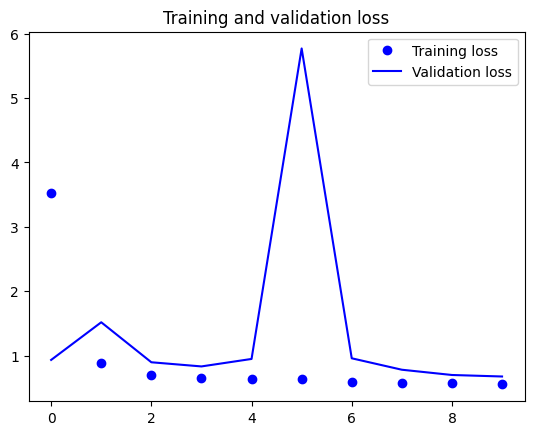

In [ ]:
acc = history2.history['binary_accuracy']
val_acc = history2.history['val_binary_accuracy']
loss = history2.history['loss']
val_loss = history2.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

##### hyperparameter 128 size layer 추가, batch 32, epoch 10, RMSprop



In [ ]:
batch_size = 32   # 16->32로 수정
epochs = 10       # 5->10으로 수정
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False)

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
input_layer3 =tf.keras.layers.Input(shape=(256, 256, 3))
x3=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer3)
x3=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x3)
x3=tf.keras.layers.BatchNormalization()(x3)
x3=tf.keras.layers.MaxPool2D((2, 2))(x3)

x3=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x3)
x3=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x3)
x3=tf.keras.layers.BatchNormalization()(x3)
x3=tf.keras.layers.MaxPool2D((2, 2))(x3)

x3=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x3)
x3=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x3)
x3=tf.keras.layers.BatchNormalization()(x3)
x3=tf.keras.layers.MaxPool2D((2, 2))(x3)

x3=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x3)
x3=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x3)
x3=tf.keras.layers.BatchNormalization()(x3)
x3=tf.keras.layers.MaxPool2D((2, 2))(x3)

x3=tf.keras.layers.Flatten()(x3)
x3=tf.keras.layers.Dense(1024, activation='relu')(x3)
x3=tf.keras.layers.Dense(512, activation='relu')(x3)
out_layer3=tf.keras.layers.Dense(1, activation='sigmoid')(x3)

model3 = tf.keras.Model(inputs=[input_layer3], outputs=[out_layer3])

In [ ]:
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.RMSprop(learning_rate=0.001)
metric=tf.keras.metrics.binary_accuracy
model3.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [ ]:
history3 = model3.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1)

Epoch 1/10
62/62 [==============================] - 41s 598ms/step - loss: 5.7453 - binary_accuracy: 0.5130 - val_loss: 1.3778 - val_binary_accuracy: 0.4980
Epoch 2/10
62/62 [==============================] - 37s 596ms/step - loss: 0.8922 - binary_accuracy: 0.5530 - val_loss: 0.7678 - val_binary_accuracy: 0.5190
Epoch 3/10
62/62 [==============================] - 39s 619ms/step - loss: 0.7539 - binary_accuracy: 0.5810 - val_loss: 0.9178 - val_binary_accuracy: 0.4950
Epoch 4/10
62/62 [==============================] - 37s 587ms/step - loss: 0.6814 - binary_accuracy: 0.6145 - val_loss: 0.8929 - val_binary_accuracy: 0.5020
Epoch 5/10
62/62 [==============================] - 37s 593ms/step - loss: 0.6453 - binary_accuracy: 0.6420 - val_loss: 0.7363 - val_binary_accuracy: 0.5730
Epoch 6/10
62/62 [==============================] - 39s 625ms/step - loss: 0.6246 - binary_accuracy: 0.6675 - val_loss: 1.4140 - val_binary_accuracy: 0.5100
Epoch 7/10
62/62 [==============================] - 39s 62

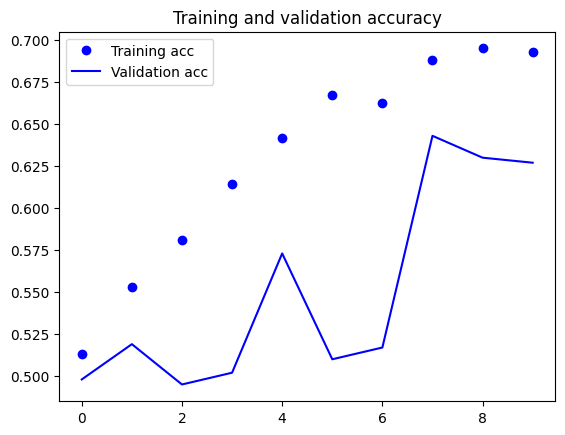

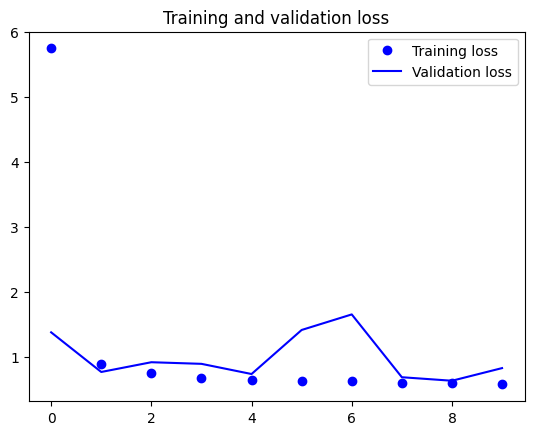

In [ ]:
acc = history3.history['binary_accuracy']
val_acc = history3.history['val_binary_accuracy']
loss = history3.history['loss']
val_loss = history3.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###### 최고 accuracy Adam : 62%, RMS prop 64% 달성!

##### hyperparameter 128 size layer 추가, batch 16, epoch 20, Adam



In [ ]:
batch_size = 16
epochs = 20
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=True)

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
input_layer4=tf.keras.layers.Input(shape=(256, 256, 3))
x4=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer4)
x4=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x4)
x4=tf.keras.layers.BatchNormalization()(x4)
x4=tf.keras.layers.MaxPool2D((2, 2))(x4)

x4=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x4)
x4=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x4)
x4=tf.keras.layers.BatchNormalization()(x4)
x4=tf.keras.layers.MaxPool2D((2, 2))(x4)

x4=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x4)
x4=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x4)
x4=tf.keras.layers.BatchNormalization()(x4)
x4=tf.keras.layers.MaxPool2D((2, 2))(x4)

x4=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x4)
x4=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x4)
x4=tf.keras.layers.BatchNormalization()(x4)
x4=tf.keras.layers.MaxPool2D((2, 2))(x4)

x4=tf.keras.layers.Flatten()(x4)
x4=tf.keras.layers.Dense(1024, activation='relu')(x4)
x4=tf.keras.layers.Dense(512, activation='relu')(x4)
out_layer4=tf.keras.layers.Dense(1, activation='sigmoid')(x4)

model4 = tf.keras.Model(inputs=[input_layer4], outputs=[out_layer4])

In [ ]:
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.001)
metric=tf.keras.metrics.binary_accuracy
model4.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])
callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]

In [ ]:
history4 = model4.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=callbacks_list,
      validation_freq=1)

Epoch 1/20
125/125 [==============================] - 40s 254ms/step - loss: 2.7381 - binary_accuracy: 0.5190 - val_loss: 1.2573 - val_binary_accuracy: 0.5180
Epoch 2/20
125/125 [==============================] - 31s 245ms/step - loss: 0.8867 - binary_accuracy: 0.5540 - val_loss: 0.8996 - val_binary_accuracy: 0.5330
Epoch 3/20
125/125 [==============================] - 31s 245ms/step - loss: 0.7586 - binary_accuracy: 0.5555 - val_loss: 0.6972 - val_binary_accuracy: 0.5660
Epoch 4/20
125/125 [==============================] - 31s 246ms/step - loss: 0.7045 - binary_accuracy: 0.5670 - val_loss: 0.6793 - val_binary_accuracy: 0.5900
Epoch 5/20
125/125 [==============================] - 31s 246ms/step - loss: 0.6842 - binary_accuracy: 0.6060 - val_loss: 0.7533 - val_binary_accuracy: 0.5900
Epoch 6/20
125/125 [==============================] - 31s 247ms/step - loss: 0.6742 - binary_accuracy: 0.6165 - val_loss: 0.6465 - val_binary_accuracy: 0.6230
Epoch 7/20
125/125 [==========================

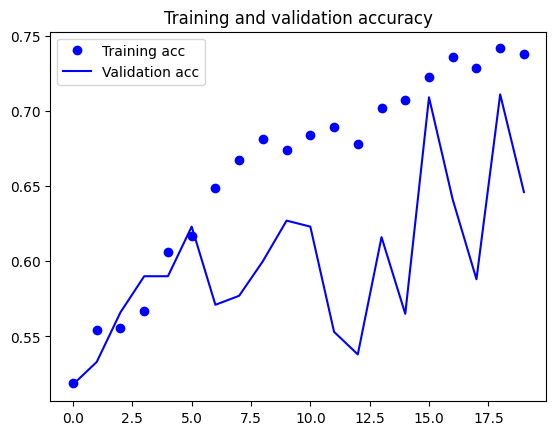

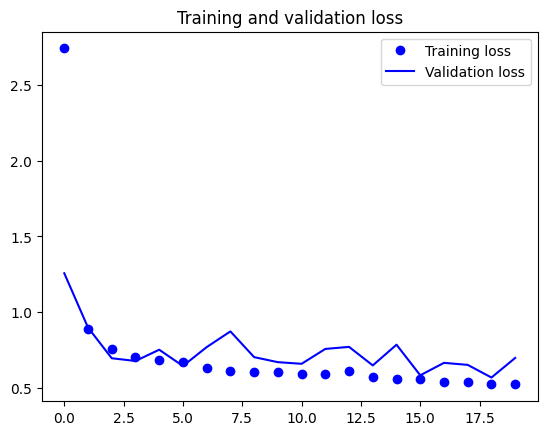

In [ ]:
acc = history4.history['binary_accuracy']
val_acc = history4.history['val_binary_accuracy']
loss = history4.history['loss']
val_loss = history4.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
print(history4.history)

{'loss': [2.738137722015381, 0.8867419958114624, 0.7585809826850891, 0.7045319676399231, 0.6841738820075989, 0.674228847026825, 0.6333044767379761, 0.6154768466949463, 0.6056104898452759, 0.6049614548683167, 0.5958556532859802, 0.5932615995407104, 0.6114326119422913, 0.5726540088653564, 0.5601677298545837, 0.5626875758171082, 0.5420497059822083, 0.5380570888519287, 0.5244021415710449, 0.5290606617927551], 'binary_accuracy': [0.5189999938011169, 0.5540000200271606, 0.5554999709129333, 0.5669999718666077, 0.6060000061988831, 0.6165000200271606, 0.6489999890327454, 0.6669999957084656, 0.6809999942779541, 0.6740000247955322, 0.6840000152587891, 0.6894999742507935, 0.6779999732971191, 0.7020000219345093, 0.7070000171661377, 0.7225000262260437, 0.7354999780654907, 0.7285000085830688, 0.7415000200271606, 0.7379999756813049], 'val_loss': [1.2572600841522217, 0.8996244668960571, 0.697201669216156, 0.6792981028556824, 0.7533259987831116, 0.6464686393737793, 0.7704201936721802, 0.8740211725234985

##### hyperparameter 128 size layer 추가, batch 16, epoch 20, RMSprop



In [ ]:
batch_size = 16
epochs = 20
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=True)

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')
image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
input_layer5=tf.keras.layers.Input(shape=(256, 256, 3))
x5=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer5)
x5=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x5)
x5=tf.keras.layers.BatchNormalization()(x5)
x5=tf.keras.layers.MaxPool2D((2, 2))(x5)

x5=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x5)
x5=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x5)
x5=tf.keras.layers.BatchNormalization()(x5)
x5=tf.keras.layers.MaxPool2D((2, 2))(x5)

x5=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x5)
x5=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x5)
x5=tf.keras.layers.BatchNormalization()(x5)
x5=tf.keras.layers.MaxPool2D((2, 2))(x5)

x5=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x5)
x5=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x5)
x5=tf.keras.layers.BatchNormalization()(x5)
x5=tf.keras.layers.MaxPool2D((2, 2))(x5)

x5=tf.keras.layers.Flatten()(x5)
x5=tf.keras.layers.Dense(1024, activation='relu')(x5)
x5=tf.keras.layers.Dense(512, activation='relu')(x5)
out_layer5=tf.keras.layers.Dense(1, activation='sigmoid')(x5)

model5 = tf.keras.Model(inputs=[input_layer5], outputs=[out_layer5])

In [ ]:
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.001)
metric=tf.keras.metrics.binary_accuracy
model5.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

In [ ]:
history5 = model5.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1)

Epoch 1/20
125/125 [==============================] - 33s 233ms/step - loss: 2.2541 - binary_accuracy: 0.5280 - val_loss: 2.6217 - val_binary_accuracy: 0.5000
Epoch 2/20
125/125 [==============================] - 30s 238ms/step - loss: 0.8648 - binary_accuracy: 0.5135 - val_loss: 0.7779 - val_binary_accuracy: 0.4910
Epoch 3/20
125/125 [==============================] - 29s 233ms/step - loss: 0.7539 - binary_accuracy: 0.5465 - val_loss: 0.7739 - val_binary_accuracy: 0.5380
Epoch 4/20
125/125 [==============================] - 29s 235ms/step - loss: 0.7069 - binary_accuracy: 0.5555 - val_loss: 0.8310 - val_binary_accuracy: 0.5380
Epoch 5/20
125/125 [==============================] - 29s 235ms/step - loss: 0.6823 - binary_accuracy: 0.5865 - val_loss: 0.7591 - val_binary_accuracy: 0.5920
Epoch 6/20
125/125 [==============================] - 30s 238ms/step - loss: 0.6591 - binary_accuracy: 0.6145 - val_loss: 0.6923 - val_binary_accuracy: 0.5710
Epoch 7/20
125/125 [==========================

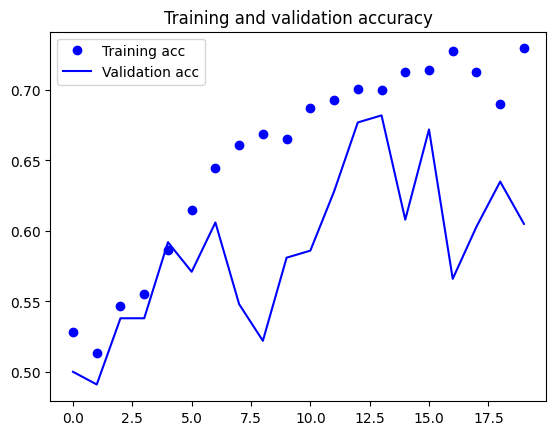

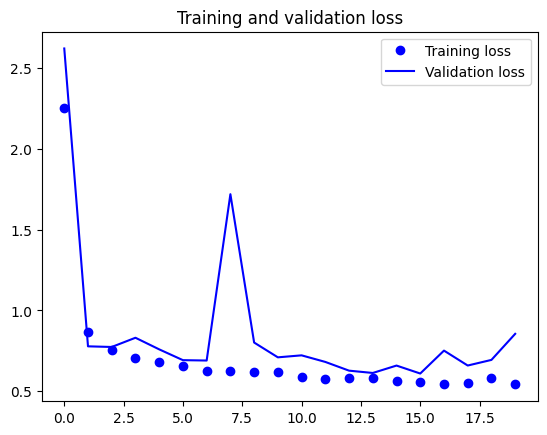

In [ ]:
acc = history5.history['binary_accuracy']
val_acc = history5.history['val_binary_accuracy']
loss = history5.history['loss']
val_loss = history5.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

######최대정확도 Adam 71%,RMSprop 68%

# fast R-CNN model

### fast R-CNN model 구현하기

필요한 라이브러리 불러오기

In [ ]:
!pip3 install tensorflow-estimator==2.6.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.9/462.9 kB 10.0 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.15.0
    Uninstalling tensorflow-estimator-2.15.0:
      Successfully uninstalled tensorflow-estimator-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires tensorflow-estimator<2.16,>=2.15.0, but you have tensorflow-estimator 2.6.0 which is incompatible.


In [ ]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

이미지를 시각화 하는 함수 만들기

In [ ]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

원하는 이미지를 다운로드하고, 정해진 가로,세로길이에 맞게 이미지를 resizing하는 함수 만들기

In [ ]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False):

  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

bounding box를 만드는 함수 만들기

In [ ]:
def draw_bounding_box_on_image(image,
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):

  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]

  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height

  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

이미지 위에 class 이름과 score를 나타내는 함수 만들기

In [ ]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

이미지 다운로드하고 사이즈 변경

<ipython-input-35-aa2905205e73>:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정


Image downloaded to /tmp/tmp_adibqdq.jpg.


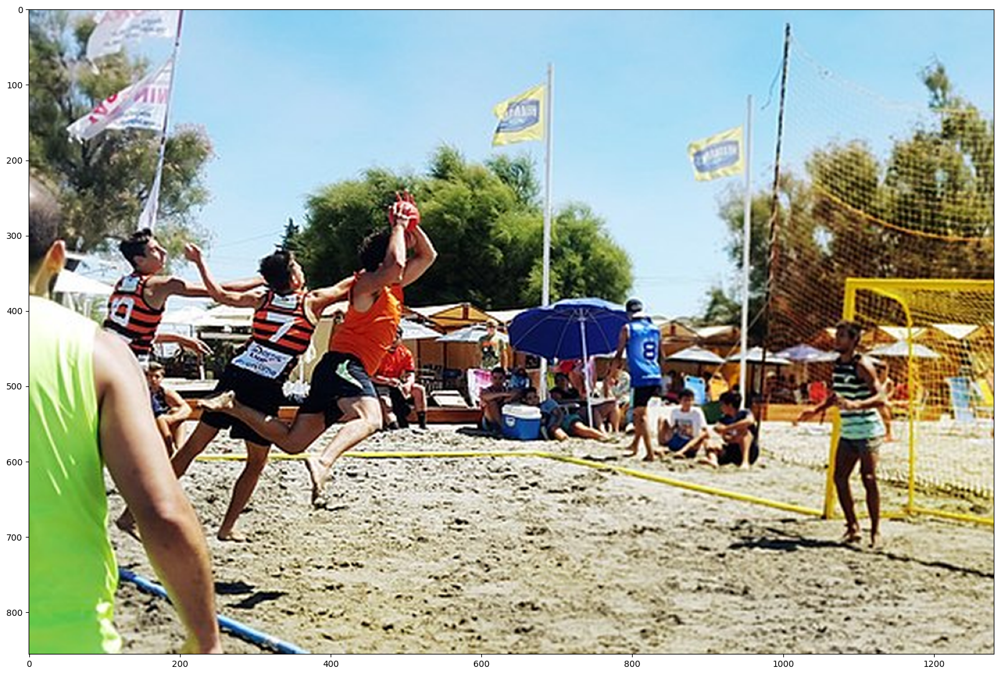

In [ ]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

tfhub에서 사전 학습된(Pre-trained) InceptionResnet 모델을 사용한 Faster RCNN 모델을 불러오기

In [ ]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

KeyboardInterrupt: 

In [ ]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

Detector를 실행하는 함수를 만듭니다.

In [ ]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  58.382490158081055


<ipython-input-36-8b156eaed91c>:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-36-8b156eaed91c>:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


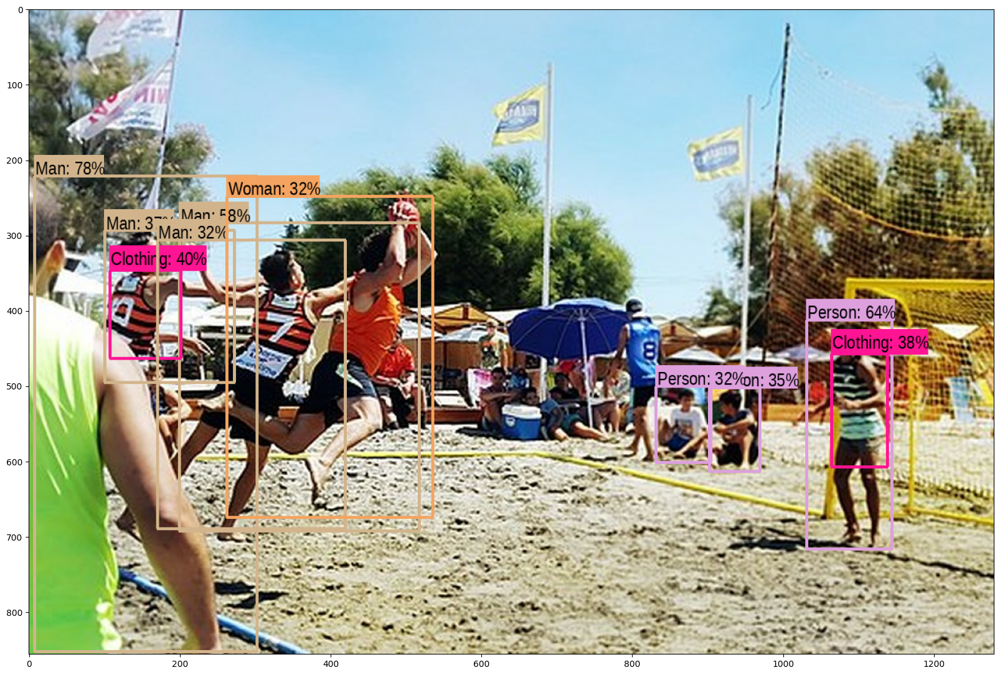

In [ ]:
run_detector(detector, downloaded_image_path)

### 문제 2-1 다른 이미지 테스트해보기

<ipython-input-35-aa2905205e73>:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정


Image downloaded to /tmp/tmpzp8kyf1j.jpg.


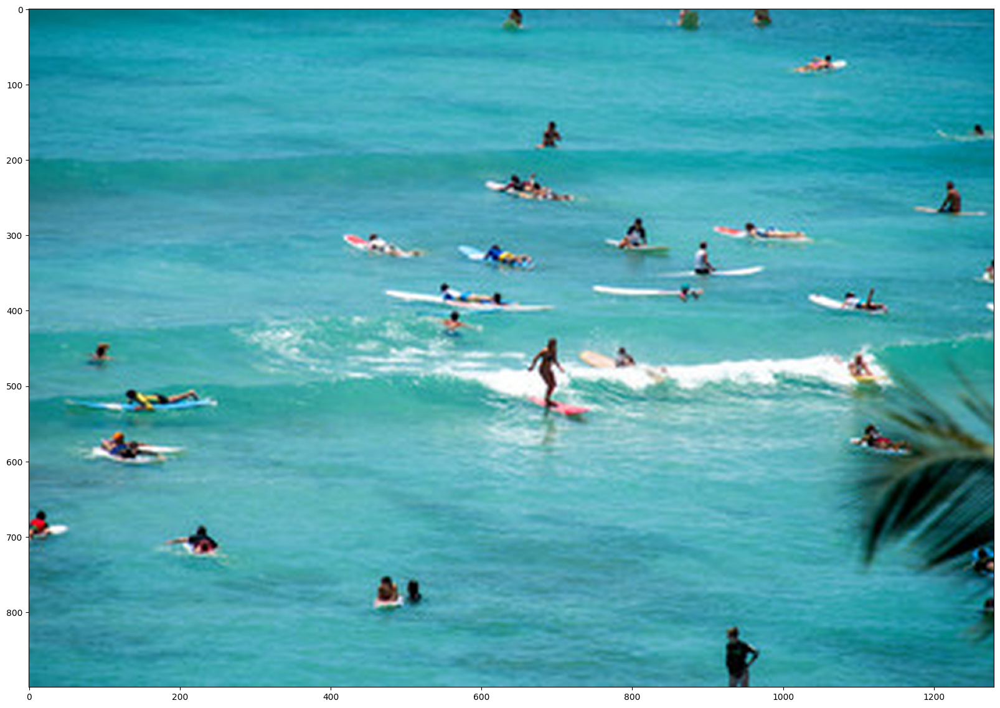

In [ ]:
# 이미지 불러오기
image_url2 = "https://t4.ftcdn.net/jpg/03/34/79/37/240_F_334793750_uyVHaqb4T4JAsGJWv6WMC1rhkwj2sxZc.jpg"
downloaded_image_path2 = download_and_resize_image(image_url2, 1280, 900, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  5.311156988143921


<ipython-input-36-8b156eaed91c>:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-36-8b156eaed91c>:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


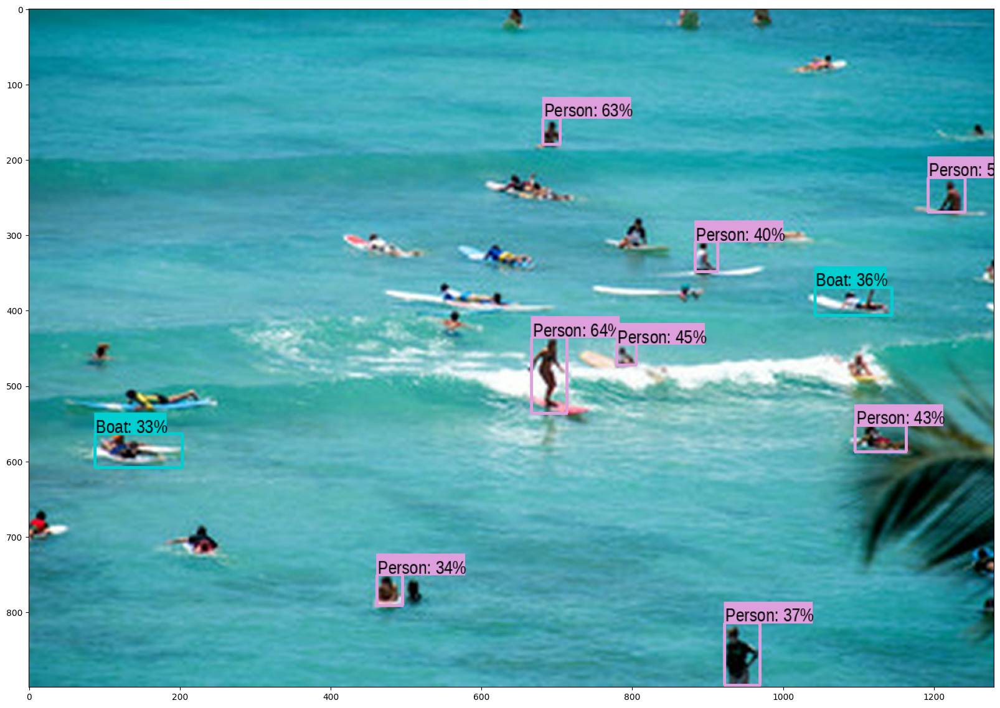

In [ ]:
run_detector(detector, downloaded_image_path2)

### 문제 2-2 다른 pre-trained model 테스트해보기 : YOLOv8n

In [ ]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 783.5/783.5 kB 18.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

# Load a model
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)

# Use the model
image_url = "https://t4.ftcdn.net/jpg/03/34/79/37/240_F_334793750_uyVHaqb4T4JAsGJWv6WMC1rhkwj2sxZc.jpg"
results = model(image_url)  # predict on an image

result = results[0]
image = result.orig_img

# Get bounding boxes and labels
boxes = result.boxes
labels = result.names


Found https://t4.ftcdn.net/jpg/03/34/79/37/240_F_334793750_uyVHaqb4T4JAsGJWv6WMC1rhkwj2sxZc.jpg locally at 240_F_334793750_uyVHaqb4T4JAsGJWv6WMC1rhkwj2sxZc.jpg
image 1/1 /content/240_F_334793750_uyVHaqb4T4JAsGJWv6WMC1rhkwj2sxZc.jpg: 448x640 21 persons, 4 surfboards, 8.1ms
Speed: 1.8ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


시각화작업1, cv2.putText 사용

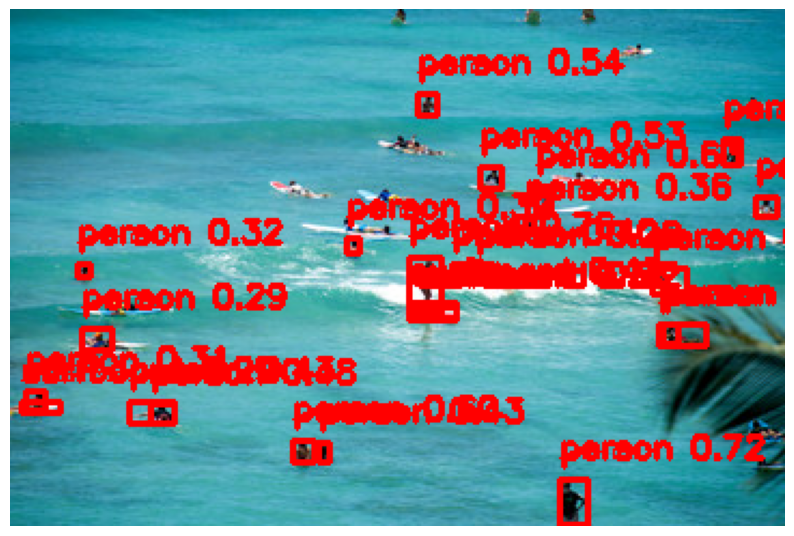

In [ ]:
# Draw bounding boxes and labels on the image
for box, label_index, conf in zip(boxes.xyxy, boxes.cls, boxes.conf):  # xyxy format
    x1, y1, x2, y2 = map(int, box[:4])
    label = labels[int(label_index)]  # Access label using label_index
    confidence = conf  # Use conf directly for confidence score
    color = (0, 0, 255)  # (B,G,R) 빨간색 b-box 그리기

    # Draw rectangle
    cv2.rectangle(image, (x1, y1), (x2, y2), color, 1)

    # Put label
    cv2.putText(image, f"{label} {confidence:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.0000001, color, 1)

# Display the image with bounding boxes
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
plt.axis('off')
plt.show()


텍스트 크기를 줄이고 싶으나... 아무리 text size 변경을 해보아도 해결되지 않아 PIL을 써볼예정!

시각화작업1, PIL 사용

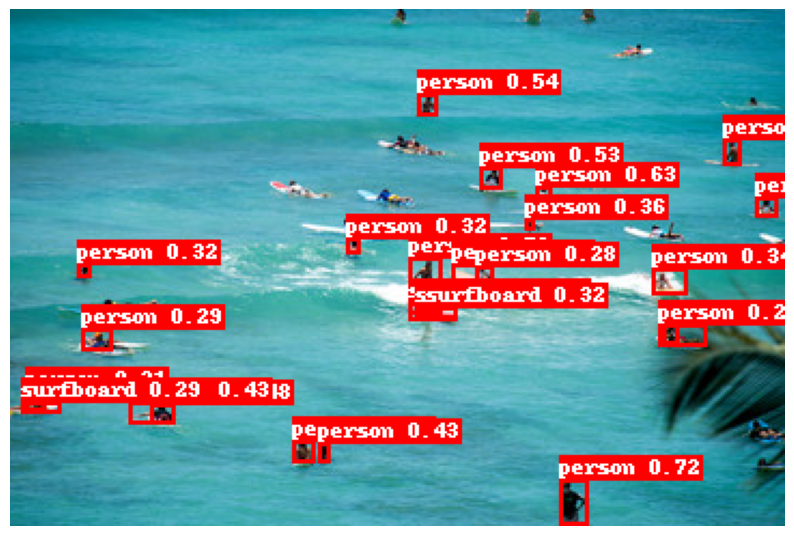

In [ ]:
from PIL import Image, ImageDraw, ImageFont

image_pil = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

# Create a drawing context
draw = ImageDraw.Draw(image_pil)

# Load a font
font_size = 10  # Adjust font size as needed
font = ImageFont.load_default() # Load default font

# Draw bounding boxes and labels on the image
for box, label_index, conf in zip(boxes.xyxy, boxes.cls, boxes.conf):  # xyxy format
    x1, y1, x2, y2 = map(int, box[:4])
    label = labels[int(label_index)]  # Access label using label_index
    confidence = conf  # Use conf directly for confidence score
    color = (255, 0, 0)  # Red color for bounding boxes and text

    # Draw rectangle
    draw.rectangle([x1, y1, x2, y2], outline=color, width=1)

    text = f"{label} {confidence:.2f}"
    text_bbox = draw.textbbox((x1, y1), text, font=font)
    text_width = text_bbox[2] - text_bbox[0]
    text_height = text_bbox[3] - text_bbox[1]
    draw.rectangle([x1, y1 - text_height, x1 + text_width, y1], fill=color)
    draw.text((x1, y1 - text_height), text, fill=(255, 255, 255), font=font)

# Convert PIL image (RGB) back to OpenCV image (BGR)
image = cv2.cvtColor(np.array(image_pil), cv2.COLOR_RGB2BGR)

# Display the image with bounding boxes
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

글씨크기를 여기서 더 줄이는거는 안되는가보다..

image.png